In [528]:
import numpy as np
import pandas as pd
import scipy
from scipy.stats import rankdata

In [82]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

sns.set()
%matplotlib inline

In [3]:
import networkx as nx

In [44]:
import igraph as ig

In [91]:
SMALL_SIZE = 10
MEDIUM_SIZE = 14
BIGGER_SIZE = 18

plt.rc('font', size=BIGGER_SIZE)
plt.rc('axes', titlesize=BIGGER_SIZE)
plt.rc('axes', labelsize=BIGGER_SIZE)
plt.rc('xtick', labelsize=BIGGER_SIZE)
plt.rc('ytick', labelsize=BIGGER_SIZE)

# Data processing

In [560]:
df = pd.read_csv('2008.csv.bz2')

In [561]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7009728 entries, 0 to 7009727
Data columns (total 29 columns):
Year                 int64
Month                int64
DayofMonth           int64
DayOfWeek            int64
DepTime              float64
CRSDepTime           int64
ArrTime              float64
CRSArrTime           int64
UniqueCarrier        object
FlightNum            int64
TailNum              object
ActualElapsedTime    float64
CRSElapsedTime       float64
AirTime              float64
ArrDelay             float64
DepDelay             float64
Origin               object
Dest                 object
Distance             int64
TaxiIn               float64
TaxiOut              float64
Cancelled            int64
CancellationCode     object
Diverted             int64
CarrierDelay         float64
WeatherDelay         float64
NASDelay             float64
SecurityDelay        float64
LateAircraftDelay    float64
dtypes: float64(14), int64(10), object(5)
memory usage: 1.5+ GB


In [562]:
df[['Year', 'Month', 'DayofMonth', 'Origin', 'Dest']].head()

,Year,Month,DayofMonth,Origin,Dest
0,2008,1,3,IAD,TPA
1,2008,1,3,IAD,TPA
2,2008,1,3,IND,BWI
3,2008,1,3,IND,BWI
4,2008,1,3,IND,BWI


In [563]:
df = df.loc[(df.Origin != 'PFN') & (df.Dest != 'PFN')]

In [564]:
df['airport1'] = df[['Origin', 'Dest']].min(axis=1)
df['airport2'] = df[['Origin', 'Dest']].max(axis=1)

In [565]:
n_flights_d = df.groupby(['Origin', 'Dest'])['Year'].count().reset_index()
n_flights_d = n_flights_d.rename(columns={'Origin': 'source', 'Dest': 'target', 'Year': 'weight'})
n_flights_d['dist'] = 1. / n_flights_d['weight']

In [566]:
n_flights = df.groupby(['airport1', 'airport2'])['Year'].count().reset_index()
n_flights = n_flights.rename(columns={'airport1': 'source', 'airport2': 'target', 'Year': 'weight'})
n_flights['dist'] = 1. / n_flights['weight']

In [567]:
n_flights.head()

,source,target,weight,dist
0,ABE,ATL,1705,0.000587
1,ABE,BHM,1,1.000000
2,ABE,CLE,1610,0.000621
3,ABE,CLT,930,0.001075
4,ABE,CVG,495,0.002020


In [568]:
n_flights_d.head()

,source,target,weight,dist
0,ABE,ATL,853,0.001172
1,ABE,BHM,1,1.000000
2,ABE,CLE,805,0.001242
3,ABE,CLT,465,0.002151
4,ABE,CVG,247,0.004049


In [569]:
n_flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2830 entries, 0 to 2829
Data columns (total 4 columns):
source    2830 non-null object
target    2830 non-null object
weight    2830 non-null int64
dist      2830 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 88.5+ KB


In [570]:
n_flights_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5358 entries, 0 to 5357
Data columns (total 4 columns):
source    5358 non-null object
target    5358 non-null object
weight    5358 non-null int64
dist      5358 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 167.5+ KB


In [571]:
meta = pd.read_csv('airport-codes.csv')

In [572]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54736 entries, 0 to 54735
Data columns (total 12 columns):
ident           54736 non-null object
type            54736 non-null object
name            54736 non-null object
elevation_ft    47785 non-null float64
continent       27259 non-null object
iso_country     54489 non-null object
iso_region      54736 non-null object
municipality    49120 non-null object
gps_code        41072 non-null object
iata_code       9171 non-null object
local_code      28591 non-null object
coordinates     54736 non-null object
dtypes: float64(1), object(11)
memory usage: 5.0+ MB


In [573]:
meta.head()

,ident,type,name,elevation_ft,continent,iso_country,iso_region,municipality,gps_code,iata_code,local_code,coordinates
0,00A,heliport,Total Rf Heliport,11.0,NaN,US,US-PA,Bensalem,00A,NaN,00A,"-74.93360137939453, 40.07080078125"
1,00AA,small_airport,Aero B Ranch Airport,3435.0,NaN,US,US-KS,Leoti,00AA,NaN,00AA,"-101.473911, 38.704022"
2,00AK,small_airport,Lowell Field,450.0,NaN,US,US-AK,Anchor Point,00AK,NaN,00AK,"-151.695999146, 59.94919968"
3,00AL,small_airport,Epps Airpark,820.0,NaN,US,US-AL,Harvest,00AL,NaN,00AL,"-86.77030181884766, 34.86479949951172"
4,00AR,closed,Newport Hospital & Clinic Heliport,237.0,NaN,US,US-AR,Newport,NaN,NaN,NaN,"-91.254898, 35.6087"


In [574]:
meta['coordinates'] = meta['coordinates'].apply(lambda x: x.split(' '))
meta['lat'] = meta['coordinates'].apply(lambda x: float(x[1]))
meta['lon'] = meta['coordinates'].apply(lambda x: float(x[0][:-1]))

In [575]:
meta.loc[meta.iata_code.notna(), ['name', 'iata_code', 'coordinates']].head()

,name,iata_code,coordinates
221,Utirik Airport,UTK,"[169.852005,, 11.222]"
437,Ocean Reef Club Airport,OCA,"[-80.274803161621,, 25.325399398804]"
591,Pilot Station Airport,PQS,"[-162.899994,, 61.934601]"
670,Crested Butte Airpark,CSE,"[-106.928341,, 38.851918]"
1085,LBJ Ranch Airport,JCY,"[-98.62249755859999,, 30.251800537100003]"


# Graph creation

In [576]:
G_d = nx.DiGraph(n_flights_d)
G = nx.Graph(n_flights)

In [577]:
for node in G.nodes:
    meta_info = meta.loc[meta.iata_code == node]
    G.nodes[node]['name'] = meta_info['name'].values[0]
    G.nodes[node]['pos'] = np.array([meta_info['lon'].values[0], meta_info['lat'].values[0]])
    G_d.nodes[node]['name'] = meta_info['name'].values[0]
    G_d.nodes[node]['pos'] = np.array([meta_info['lon'].values[0], meta_info['lat'].values[0]])

In [578]:
G.number_of_edges(), G.number_of_nodes()

(2830, 304)

In [579]:
G_d.number_of_edges()

5358

# Stats computing

In [580]:
def plot_graph(graph, method='spring', node_color='b', edge_color='r', node_size=100, arrow_size=5):
    plt.figure(figsize=(15, 10))
    if method == 'real_coord':
        pos = dict()
        for node, attr in graph.nodes.data():
            pos[node] = attr['pos']
    elif method == 'spring':
        pos = nx.spring_layout(graph)
    elif method == 'circle':
        pos = nx.circular_layout(graph)
    elif method == 'spectral':
        pos = nx.spectral_layout(graph, weight=None)
    
    if edge_color == 'r' and node_color == 'b':
        nx.draw(graph, pos=pos, node_color=node_color, edge_color=edge_color, node_size=node_size, arrow_size=arrow_size)
    elif node_color != 'b':
        nx.draw(graph, pos=pos, node_color=node_color, edge_color=edge_color, node_size=node_size, arrow_size=arrow_size, 
                cmap=plt.get_cmap('plasma'), vmin=np.min(node_color), vmax=np.max(node_color))
    elif edge_color != 'r':
        nx.draw(graph, pos=pos, node_color=node_color, edge_color=edge_color, node_size=node_size, arrow_size=arrow_size, 
                edge_cmap=plt.get_cmap('plasma'), edge_vmin=np.min(edge_color), edge_vmax=np.max(edge_color))
    plt.show()

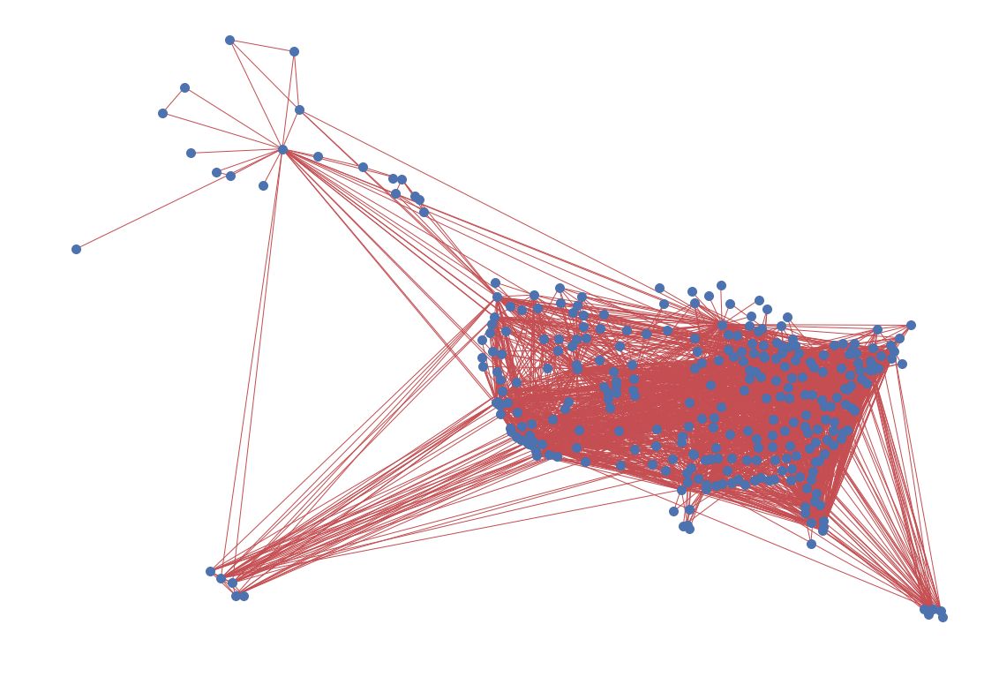

In [581]:
plot_graph(G, 'real_coord')

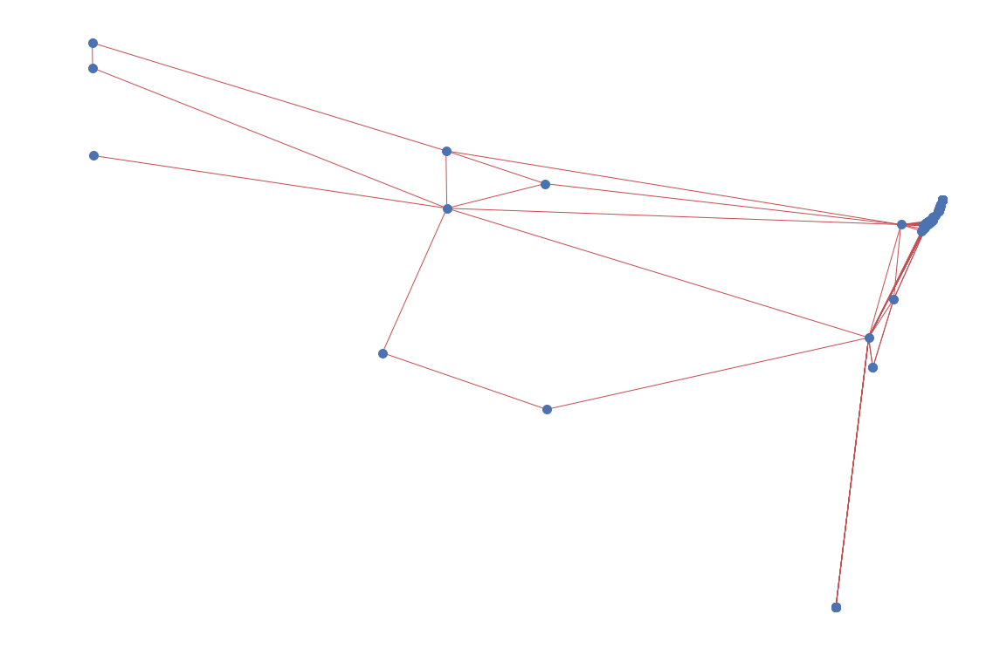

In [582]:
plot_graph(G, 'spectral')

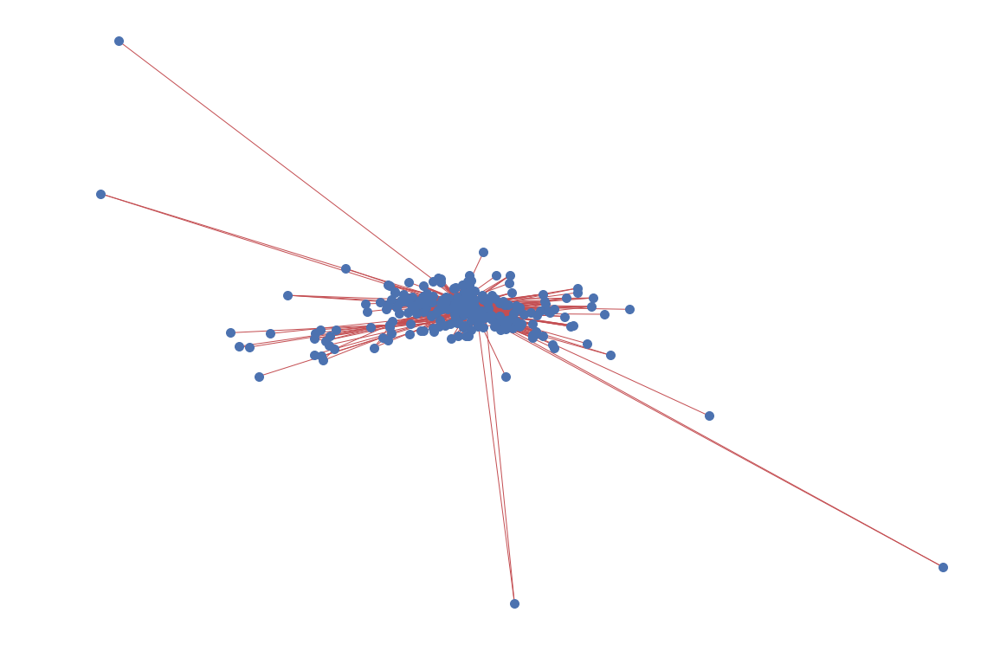

In [583]:
plot_graph(G, 'spring')

## Degree distribution

In [584]:
degrees, counts = np.unique([deg for k, deg in G.degree], return_counts=True)

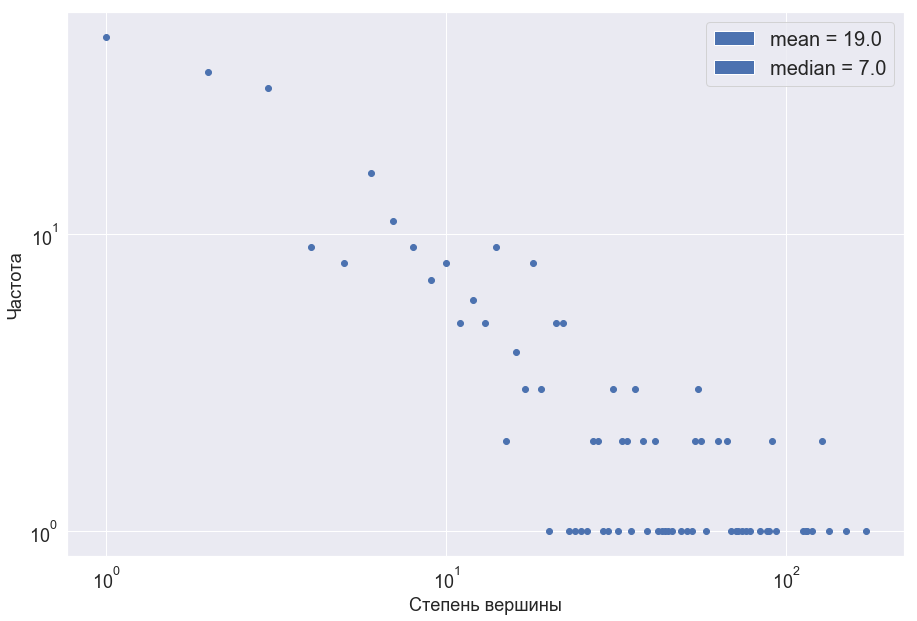

In [585]:
raw_degrees = [deg for k, deg in G.degree]
degrees, counts = np.unique(raw_degrees, return_counts=True)
plt.figure(figsize=(15, 10))
plt.scatter(degrees, counts)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Степень вершины')
plt.ylabel('Частота')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.round(np.mean(raw_degrees)))),
                   mpatches.Patch(label='median = {}'.format(np.median(raw_degrees)))], fontsize=20)
plt.show()

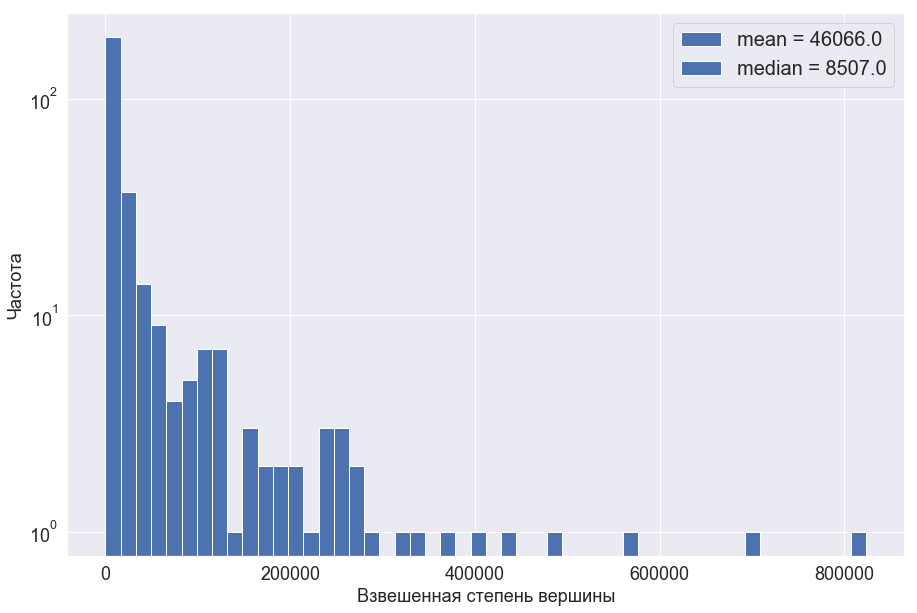

In [586]:
# degrees, counts = np.unique([deg for k, deg in G_w.degree(weight='weight')], return_counts=True)
plt.figure(figsize=(15, 10))
raw_degrees = [deg for k, deg in G_w.degree(weight='weight')]
plt.hist(raw_degrees, bins=50)
plt.yscale('log')
# plt.xscale('log')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.round(np.mean(raw_degrees)))),
                   mpatches.Patch(label='median = {}'.format(np.median(raw_degrees)))], fontsize=20)
plt.xlabel('Взвешенная степень вершины')
plt.ylabel('Частота')
plt.show()

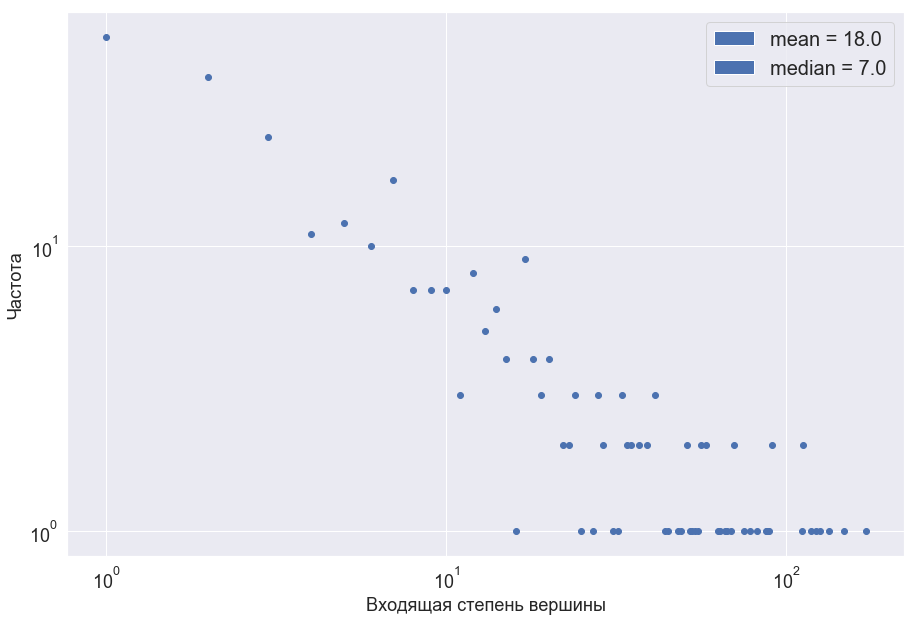

In [587]:
raw_degrees = [deg for k, deg in G_d.in_degree]
degrees, counts = np.unique(raw_degrees, return_counts=True)
plt.figure(figsize=(15, 10))
plt.scatter(degrees[1:], counts[1:])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Входящая степень вершины')
plt.ylabel('Частота')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.round(np.mean(raw_degrees)))),
                   mpatches.Patch(label='median = {}'.format(np.median(raw_degrees)))], fontsize=20)
plt.show()

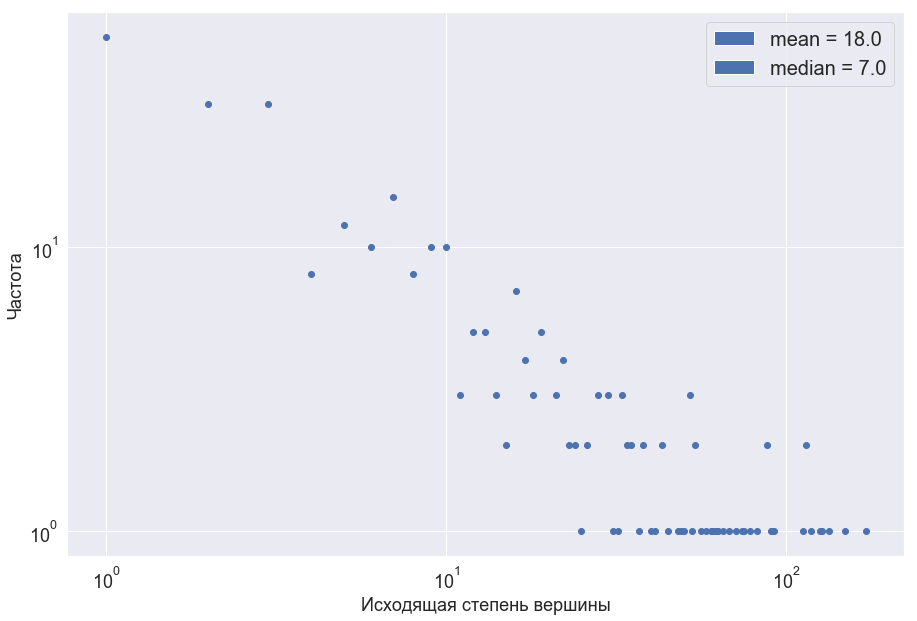

In [588]:
raw_degrees = [deg for k, deg in G_d.out_degree]
degrees, counts = np.unique(raw_degrees, return_counts=True)
plt.figure(figsize=(15, 10))
plt.scatter(degrees[1:], counts[1:])
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Исходящая степень вершины')
plt.ylabel('Частота')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.round(np.mean(raw_degrees)))),
                   mpatches.Patch(label='median = {}'.format(np.median(raw_degrees)))], fontsize=20)
plt.show()

## Плотность графа

In [589]:
# Плотность направленного графа
n = G_d.number_of_nodes()
G_d.number_of_edges() / (n * (n - 1))

0.05816831683168317

In [590]:
# Плотность ненаправленного графа
n = G.number_of_nodes()
G.number_of_edges() / (n * (n - 1) / 2)

0.06144693416710092

## Диаметр, радиус, малый мир?

In [591]:
nx.radius(G)

3

In [592]:
nx.diameter(G)

5

In [593]:
ecc = nx.eccentricity(G)

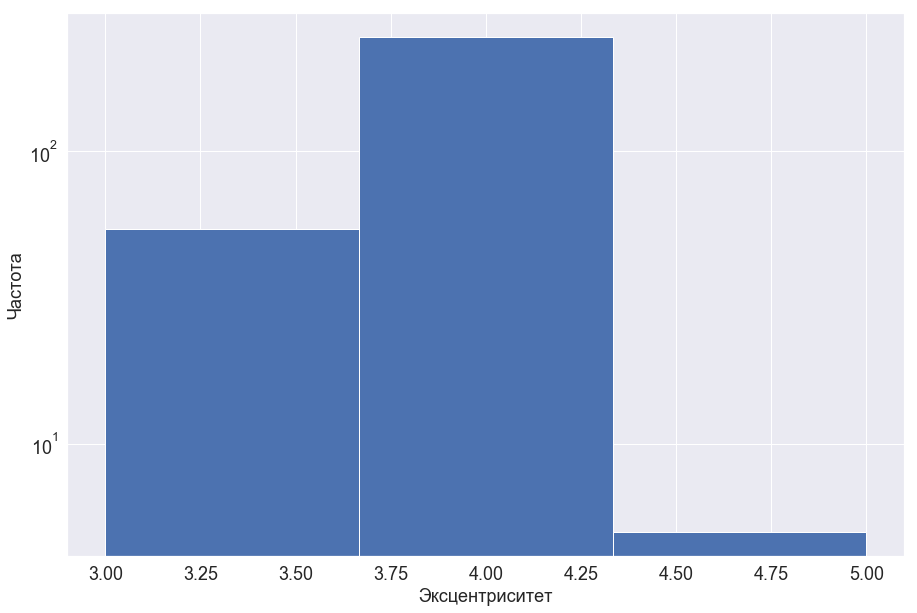

In [594]:
plt.figure(figsize=(15, 10))
plt.hist([v for k, v in ecc.items()], bins=3)
plt.yscale('log')
# plt.xscale('log')
plt.xlabel('Эксцентриситет')
plt.ylabel('Частота')
plt.show()

In [230]:
print([k for k, v in ecc.items() if v == 5])

['YAK', 'PUB', 'GST', 'PSG', 'WRG']


## Коэффициент кластеризации

In [595]:
local_clusterings = list(nx.cluster.clustering(G).values())

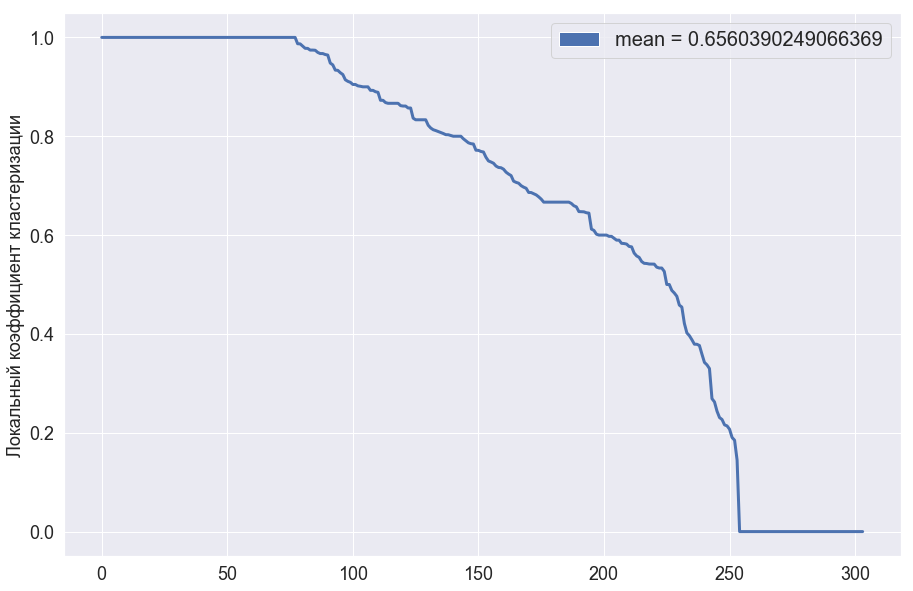

In [596]:
plt.figure(figsize=(15, 10))
plt.plot(sorted(local_clusterings)[::-1], linewidth=3)
# plt.yscale('log')
# plt.xscale('log')
# plt.xlabel('Исходящая степень вершины')
plt.ylabel('Локальный коэффициент кластеризации')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.mean(local_clusterings)))], fontsize=20)
plt.show()

## Spanning tree

In [597]:
G_tree = nx.minimum_spanning_tree(G, weight='dist')

In [598]:
G.number_of_edges()

2830

In [599]:
G_tree.number_of_edges()

303

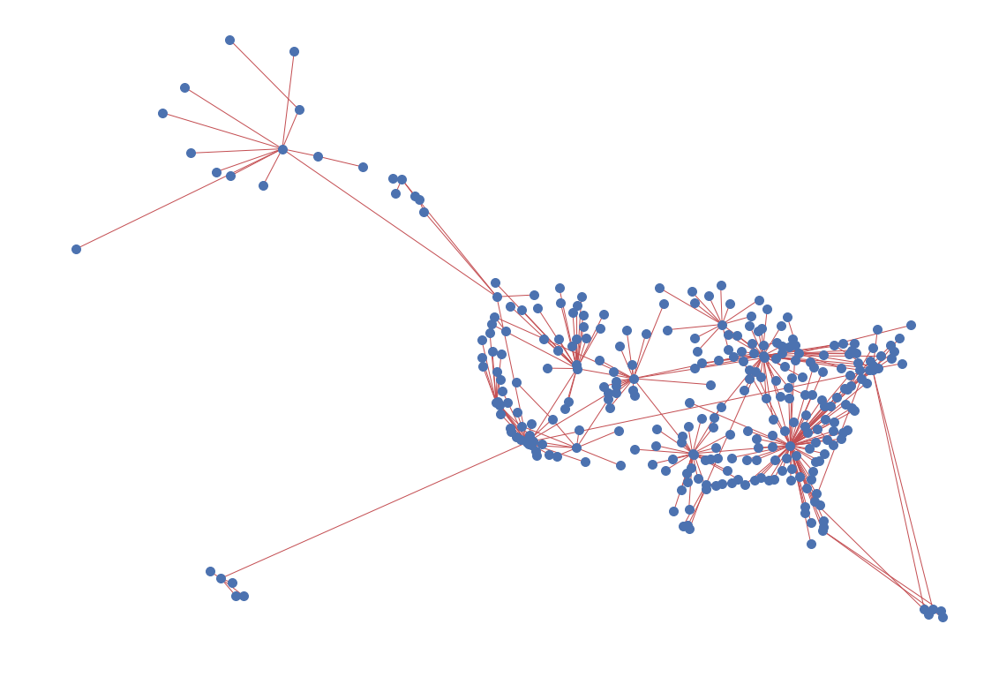

In [600]:
plot_graph(G_tree, 'real_coord')

## Pagerank

In [601]:
pageranks = nx.pagerank(G_d)

In [602]:
pagerank_vals = list(pageranks.values())

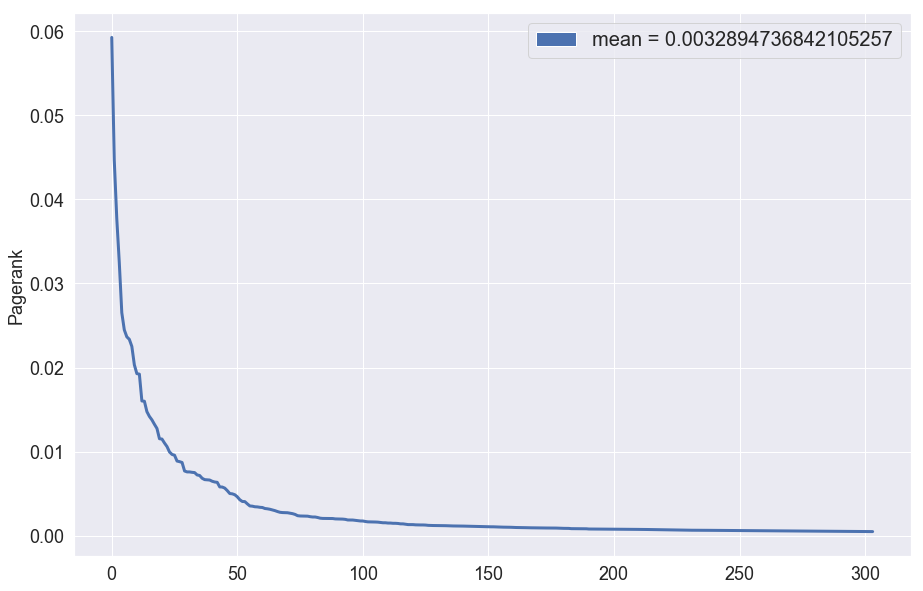

In [603]:
plt.figure(figsize=(15, 10))
plt.plot(sorted(pagerank_vals)[::-1], linewidth=3)
# plt.yscale('log')
# plt.xscale('log')
# plt.xlabel('Исходящая степень вершины')
plt.ylabel('Pagerank')
plt.legend(handles=[mpatches.Patch(label='mean = {}'.format(np.mean(pagerank_vals)))], fontsize=20)
plt.show()

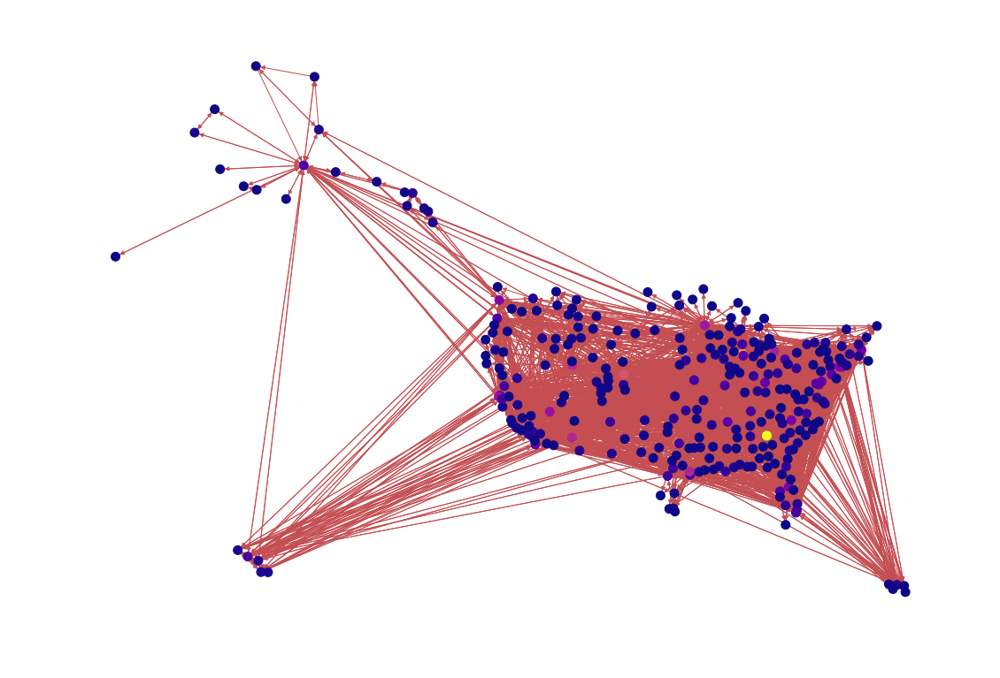

In [604]:
node_color = []
for node in G_d.nodes:
    node_color.append(pageranks[node])

plot_graph(G_d, 'real_coord', node_color=node_color)

In [357]:
for k, v in sorted(pageranks.items(), key=lambda x: x[1])[::-1][:5]:
    print(G_d.nodes[k]['name'], '-', v)

Hartsfield Jackson Atlanta International Airport - 0.059256727037606295
Chicago O'Hare International Airport - 0.0446709758789024
Dallas Fort Worth International Airport - 0.03773262323516597
Denver International Airport - 0.032508998525420864
Los Angeles International Airport - 0.02652597213875367


## Центральности

In [605]:
degree_centralities = nx.centrality.degree_centrality(G)

In [606]:
betweenness_centralities = nx.centrality.betweenness_centrality(G, seed=1)
betweenness_weighted_centralities = nx.centrality.betweenness_centrality(G, weight='dist', seed=1)

In [607]:
closeness_centralities = nx.centrality.closeness_centrality(G)
closeness_weighted_centralities = nx.centrality.closeness_centrality(G, distance='dist')

In [608]:
eigenvector_centralities = nx.centrality.eigenvector_centrality(G)
eigenvector_weighted_centralities = nx.centrality.eigenvector_centrality(G, weight='weight')
eigenvector_weighted2_centralities = nx.centrality.eigenvector_centrality(G, weight='dist')

In [609]:
harmonic_centralities = nx.centrality.harmonic_centrality(G)
harmonic_weighted_centralities = nx.centrality.harmonic_centrality(G, distance='dist')

In [610]:
subgraph_centralities = nx.centrality.subgraph_centrality(G)

In [612]:
def plot_centralities(G, centralities):
    node_color = []
    for node in G.nodes:
        node_color.append(centralities[node])

    plot_graph(G, 'real_coord', node_color=node_color)

--------------------
degree_centralities


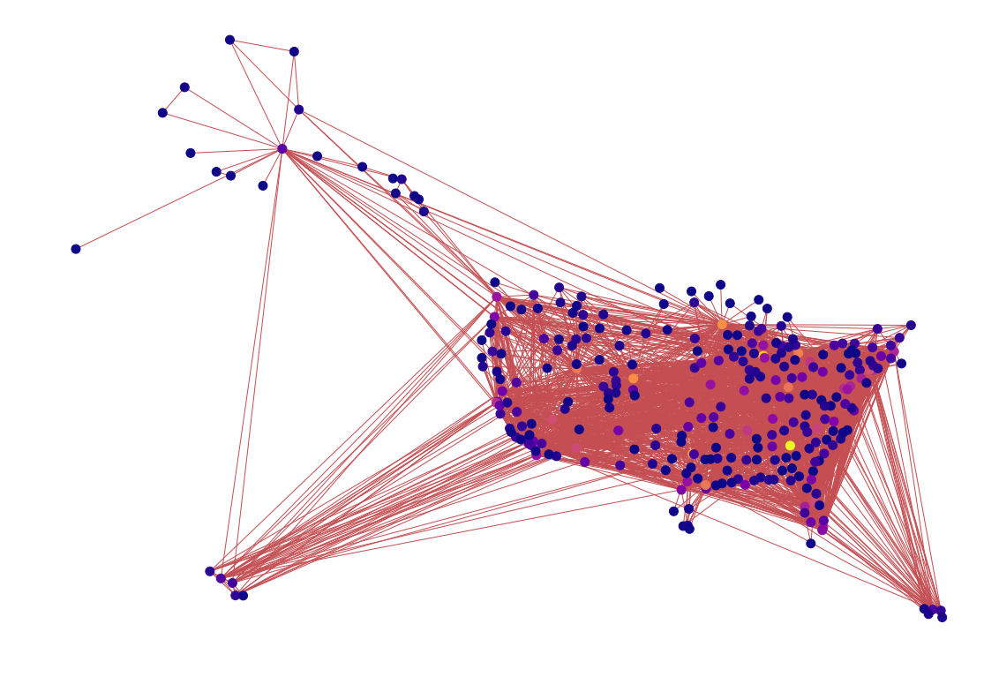

--------------------
betweenness_centralities


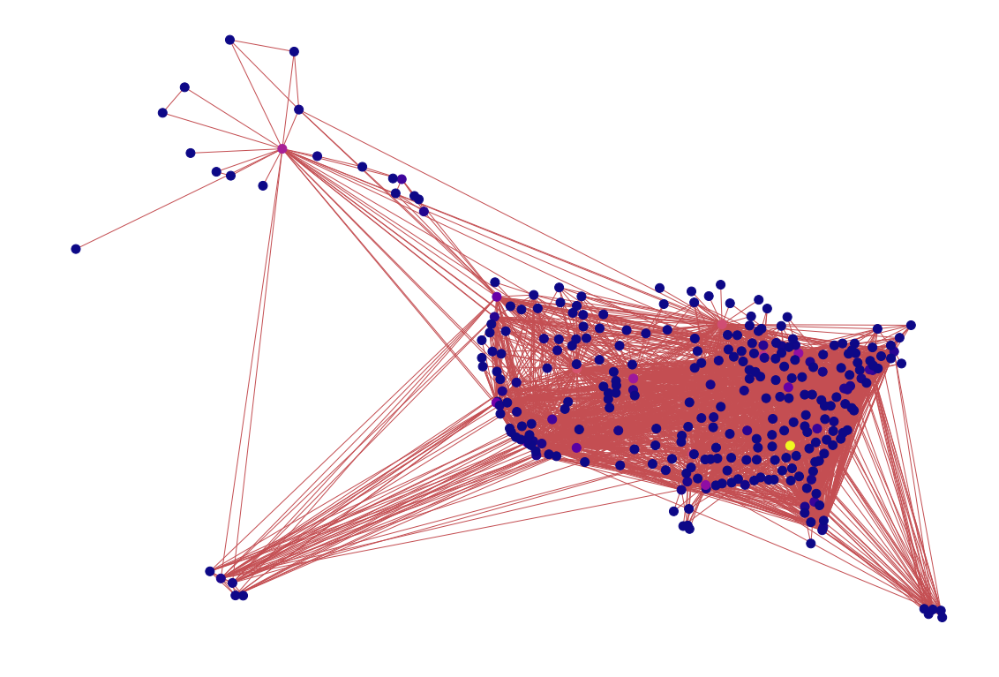

--------------------
betweenness_weighted_centralities


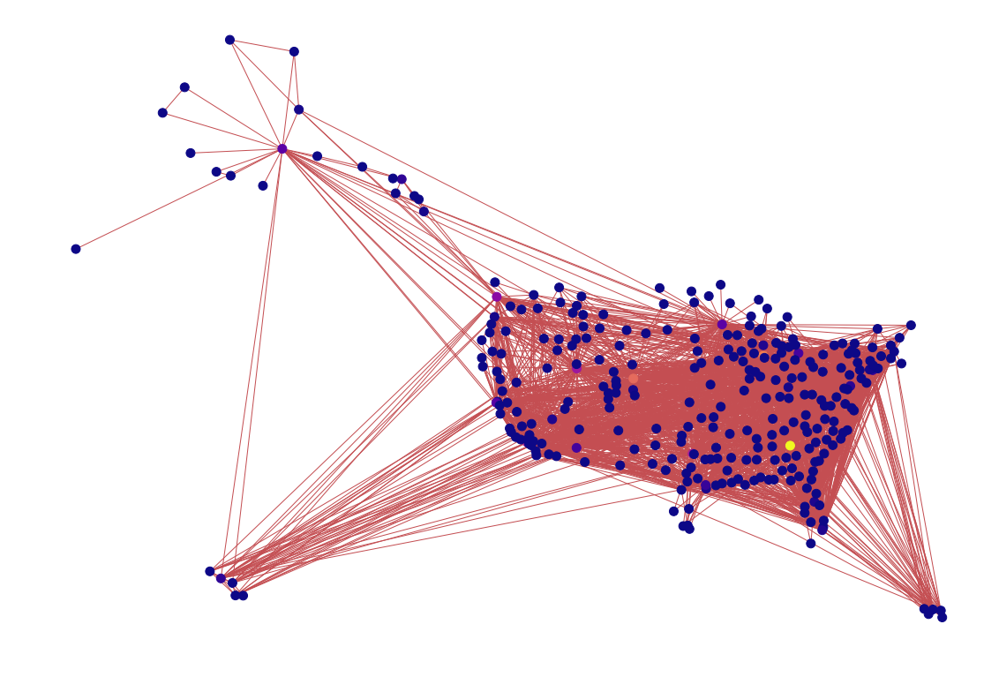

--------------------
closeness_centralities


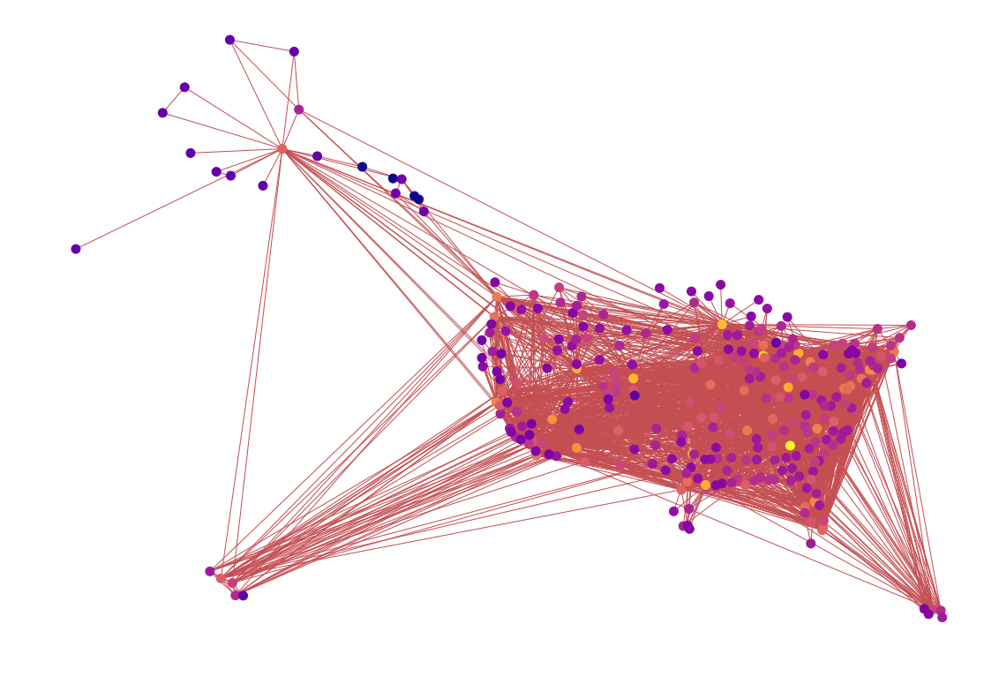

--------------------
closeness_weighted_centralities


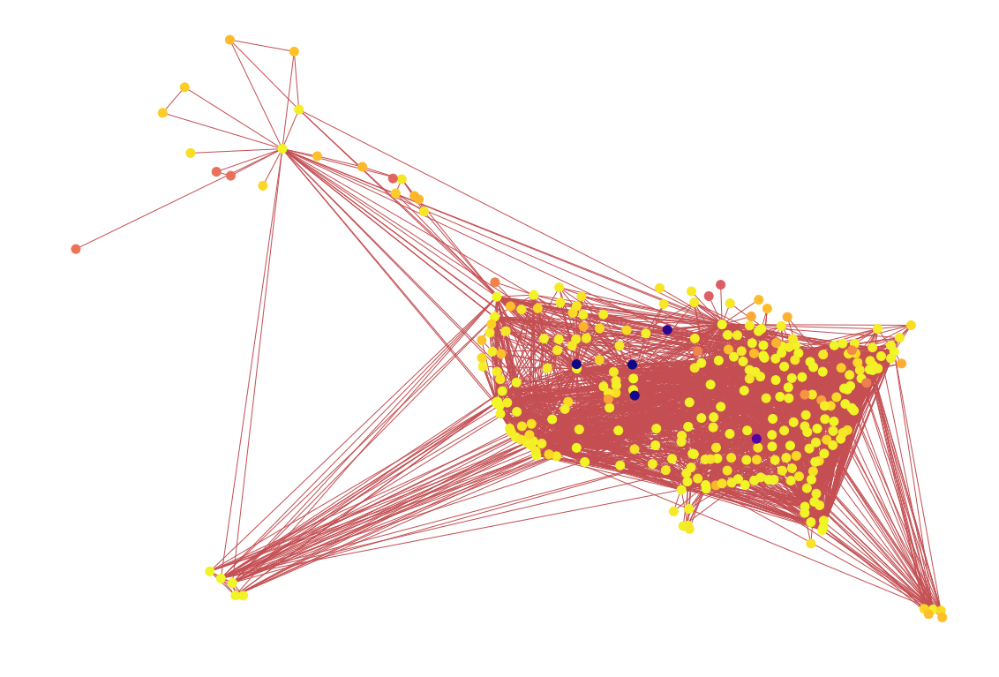

--------------------
eigenvector_centralities


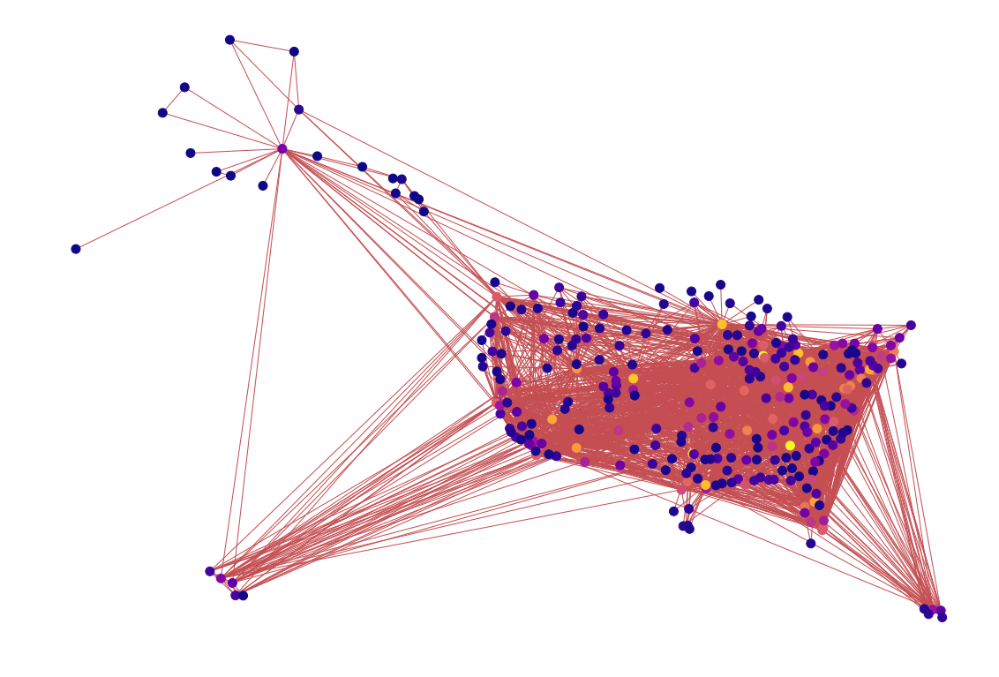

--------------------
eigenvector_weighted_centralities


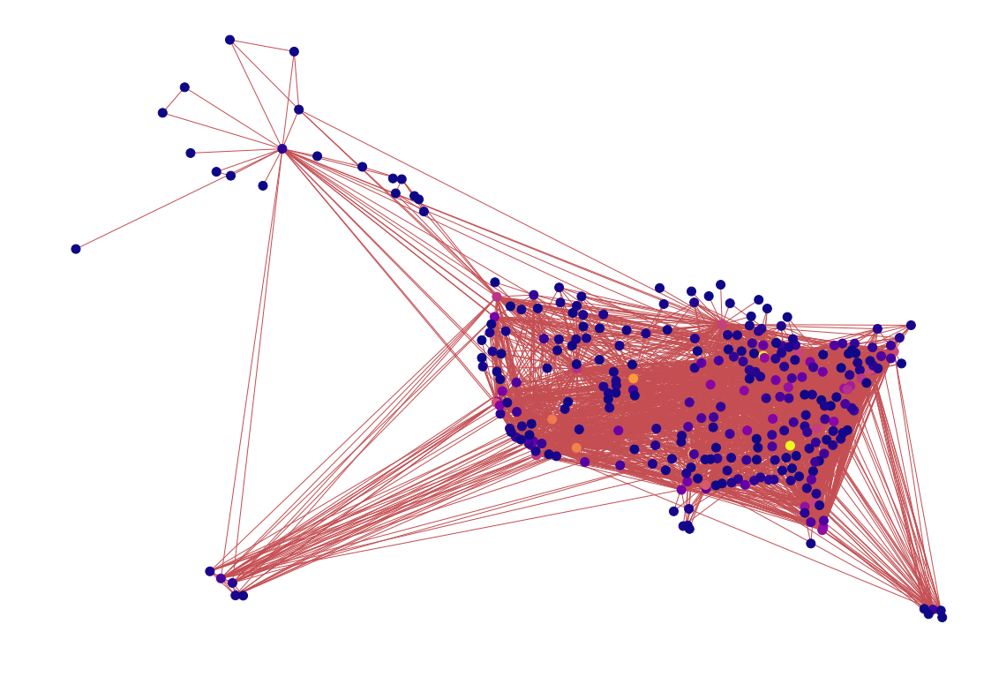

--------------------
harmonic_centralities


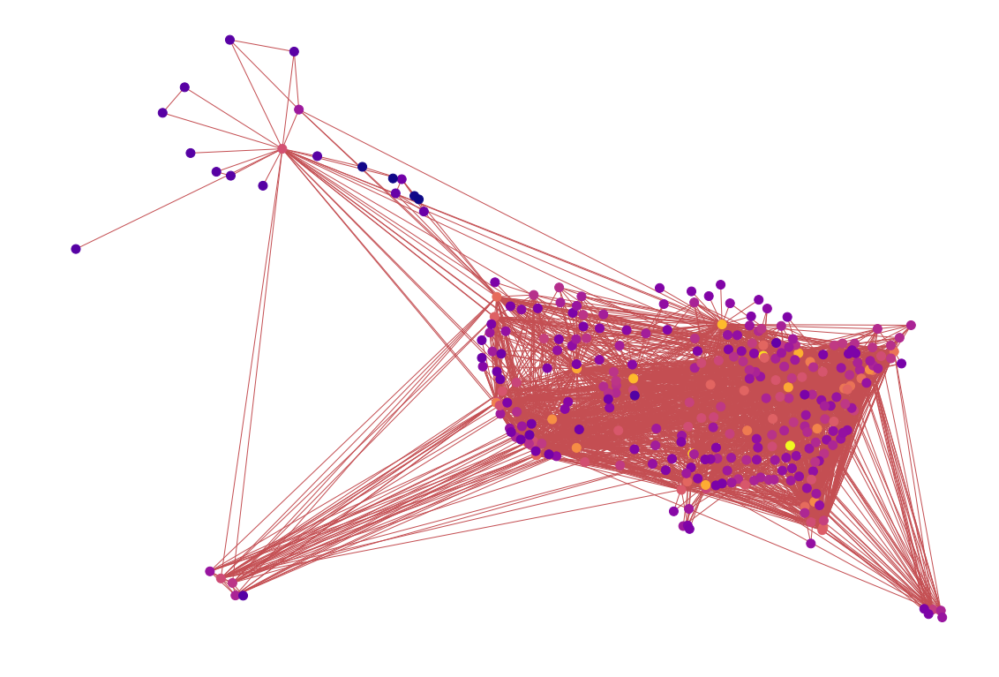

--------------------
harmonic_weighted_centralities


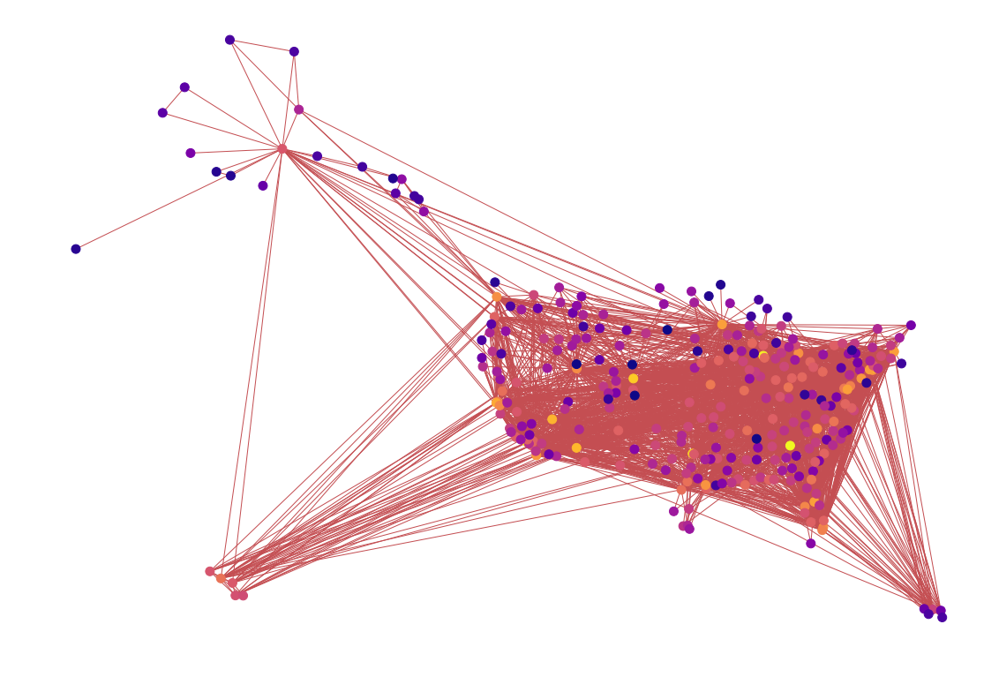

--------------------
subgraph_centralities


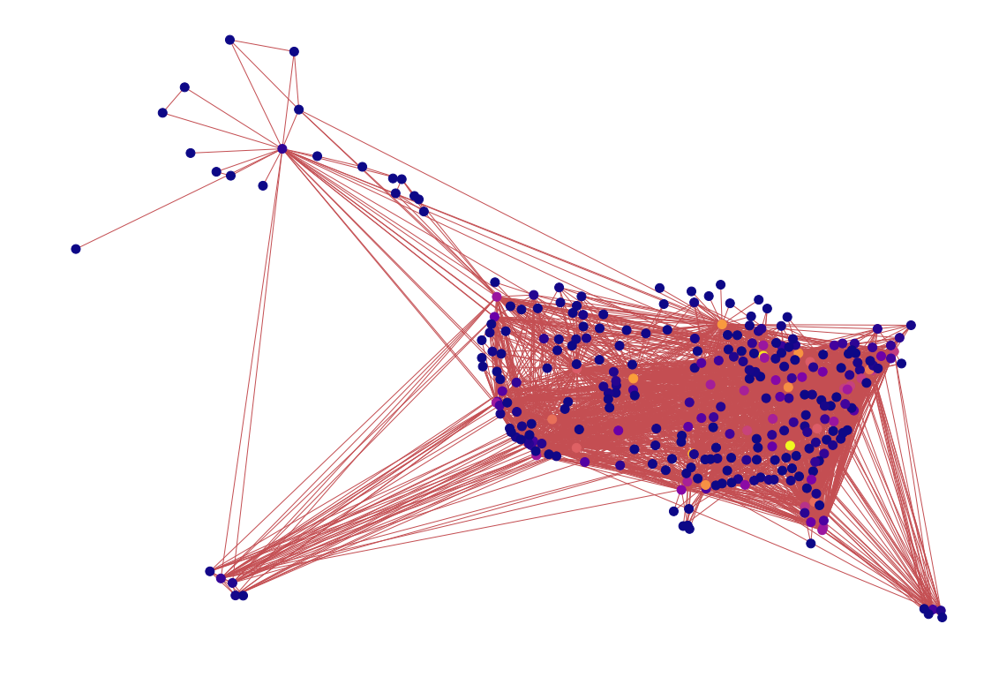

In [613]:
print('-' * 20)
print('degree_centralities')
plot_centralities(G, degree_centralities)

print('-' * 20)
print('betweenness_centralities')
plot_centralities(G, betweenness_centralities)

print('-' * 20)
print('betweenness_weighted_centralities')
plot_centralities(G, betweenness_weighted_centralities)

print('-' * 20)
print('closeness_centralities')
plot_centralities(G, closeness_centralities)

print('-' * 20)
print('closeness_weighted_centralities')
plot_centralities(G, closeness_weighted_centralities)

print('-' * 20)
print('eigenvector_centralities')
plot_centralities(G, eigenvector_centralities)

print('-' * 20)
print('eigenvector_weighted_centralities')
plot_centralities(G, eigenvector_weighted_centralities)

print('-' * 20)
print('harmonic_centralities')
plot_centralities(G, harmonic_centralities)

print('-' * 20)
print('harmonic_weighted_centralities')
plot_centralities(G, harmonic_weighted_centralities)

print('-' * 20)
print('subgraph_centralities')
plot_centralities(G, subgraph_centralities)

# Выделение сообществ

## Core numbers

In [614]:
core_numbers = nx.core_number(G)

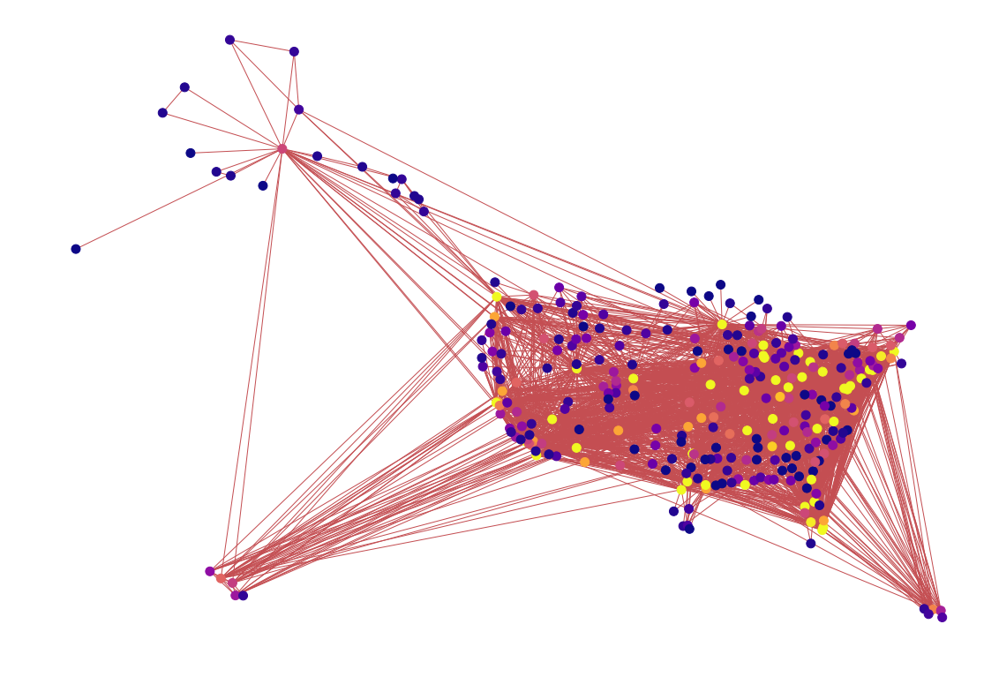

In [615]:
plot_centralities(G, core_numbers)

## Girvan-Newmann

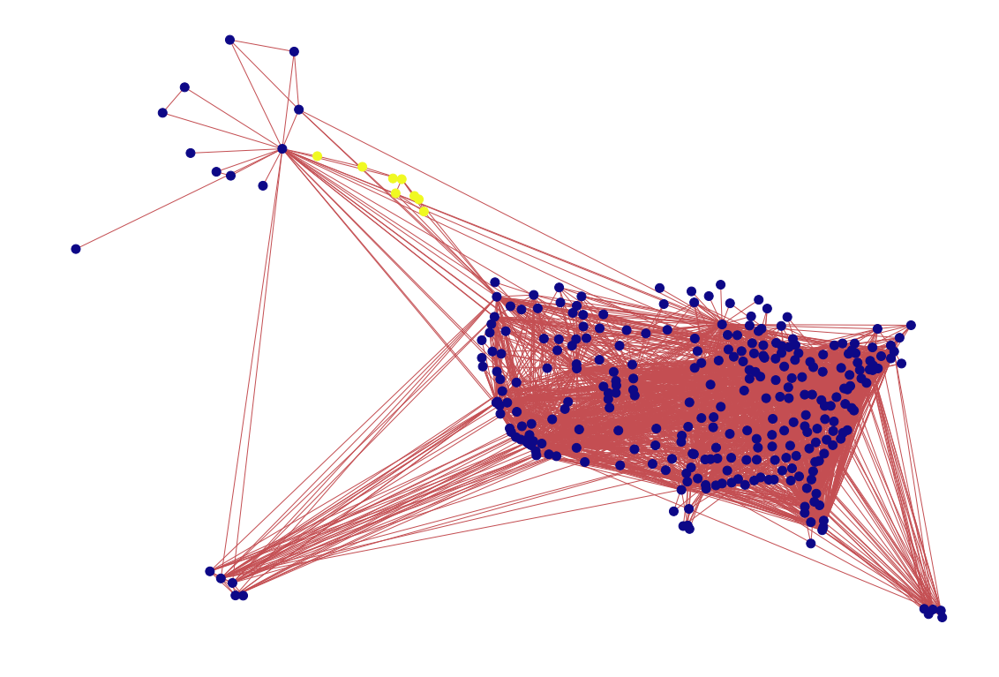

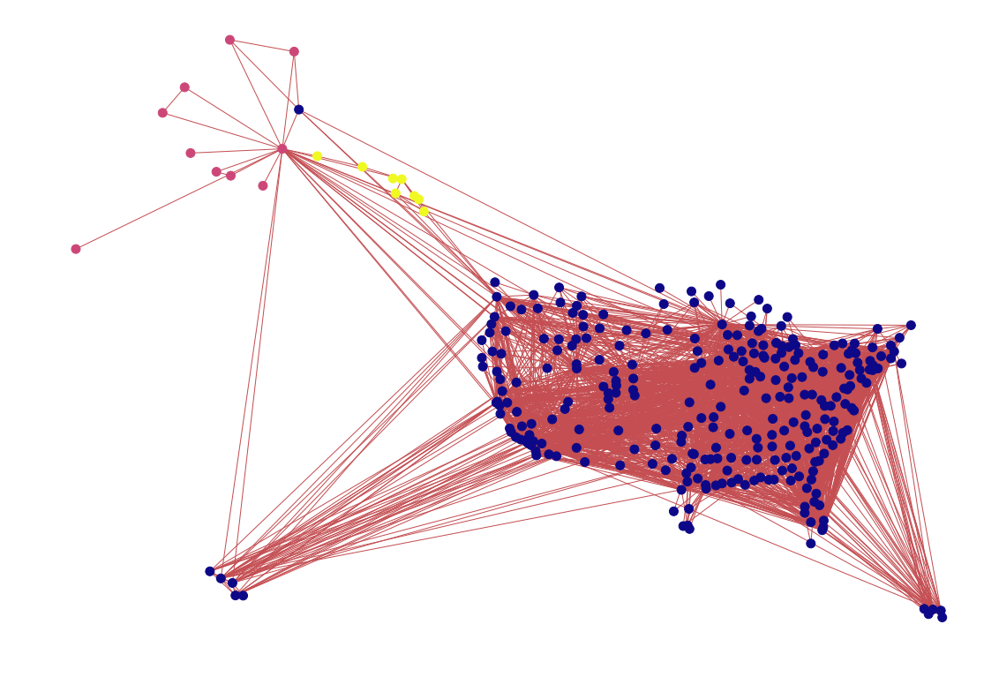

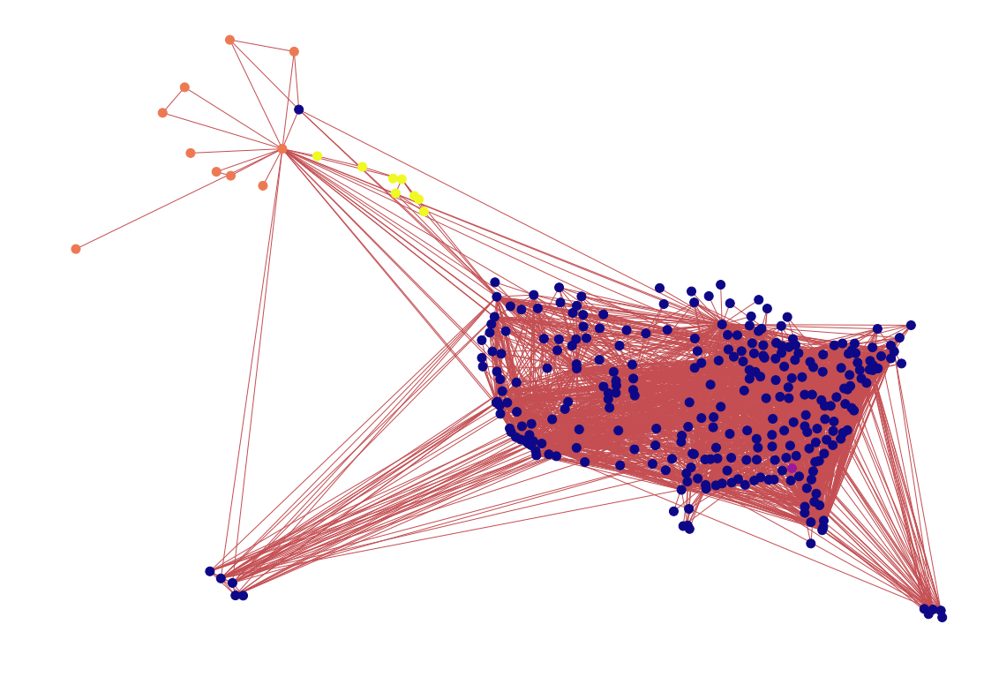

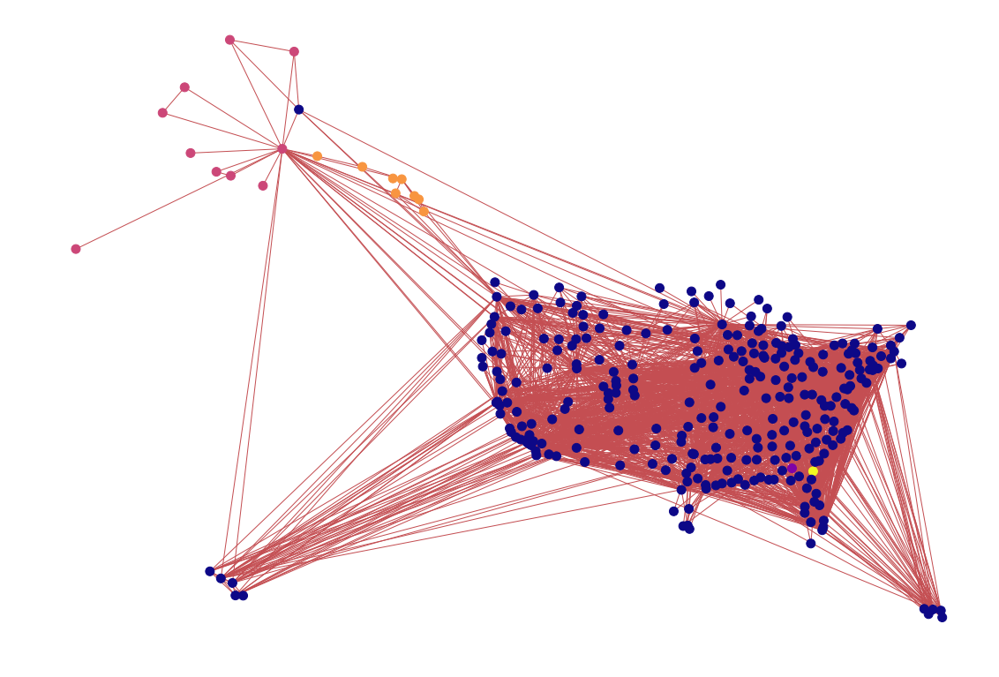

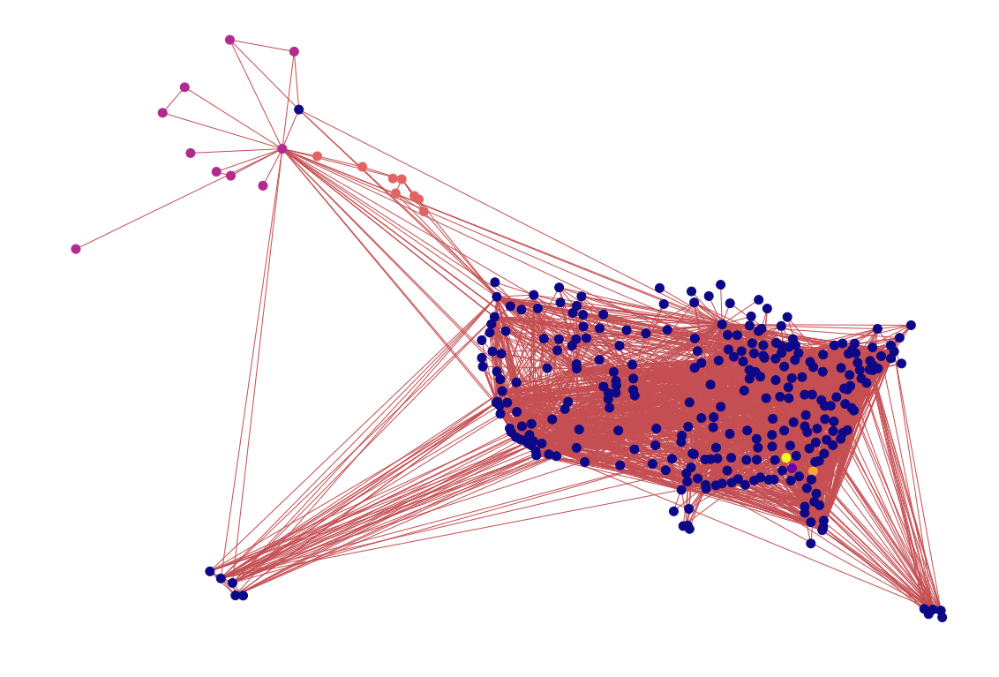

...

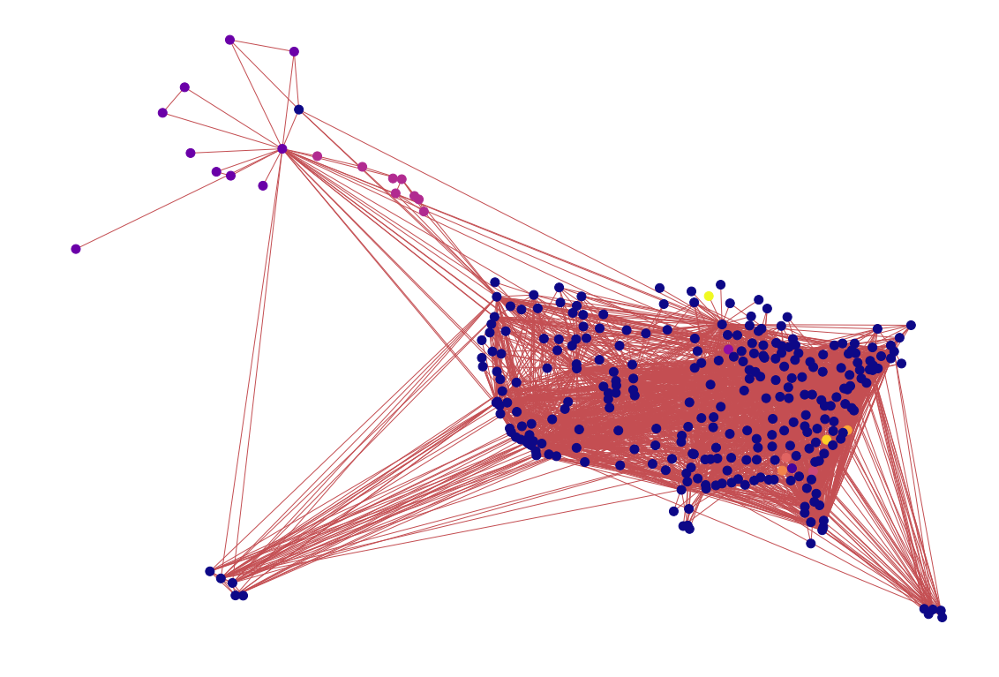

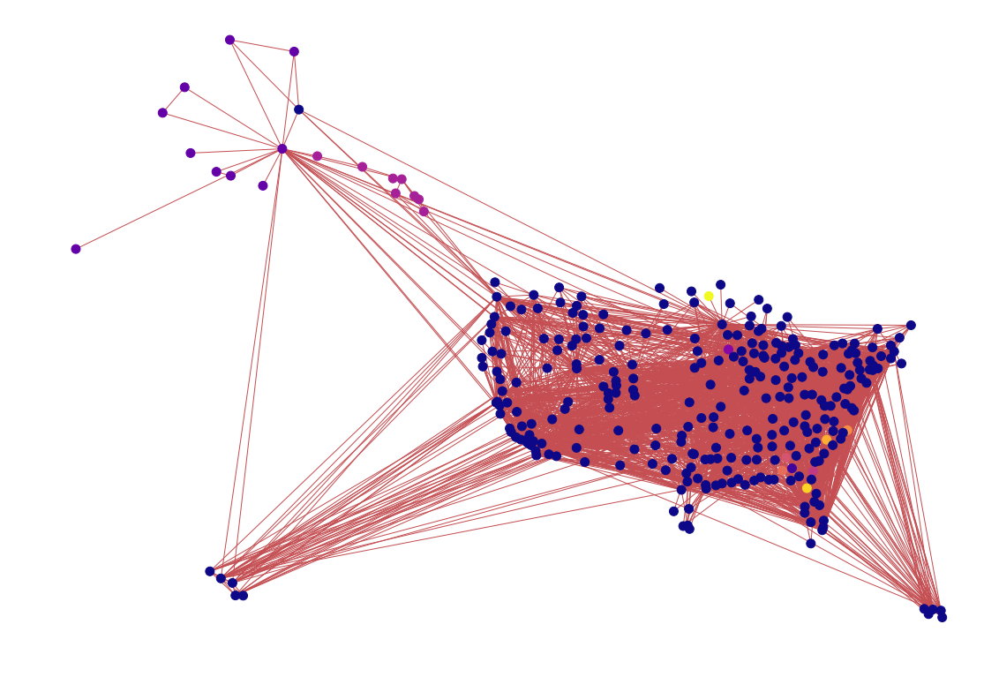

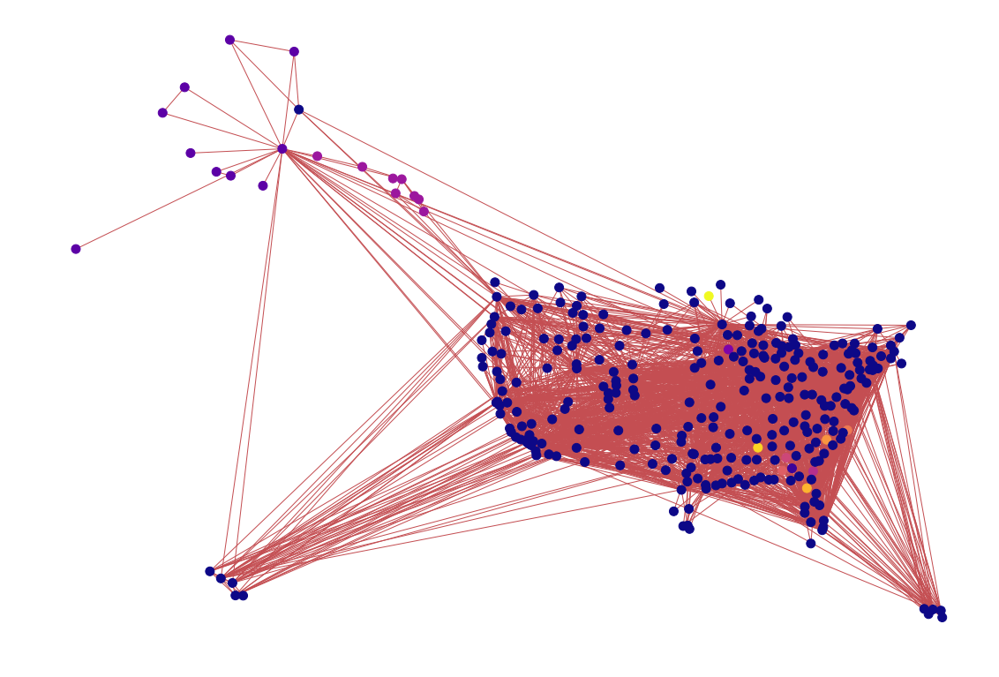

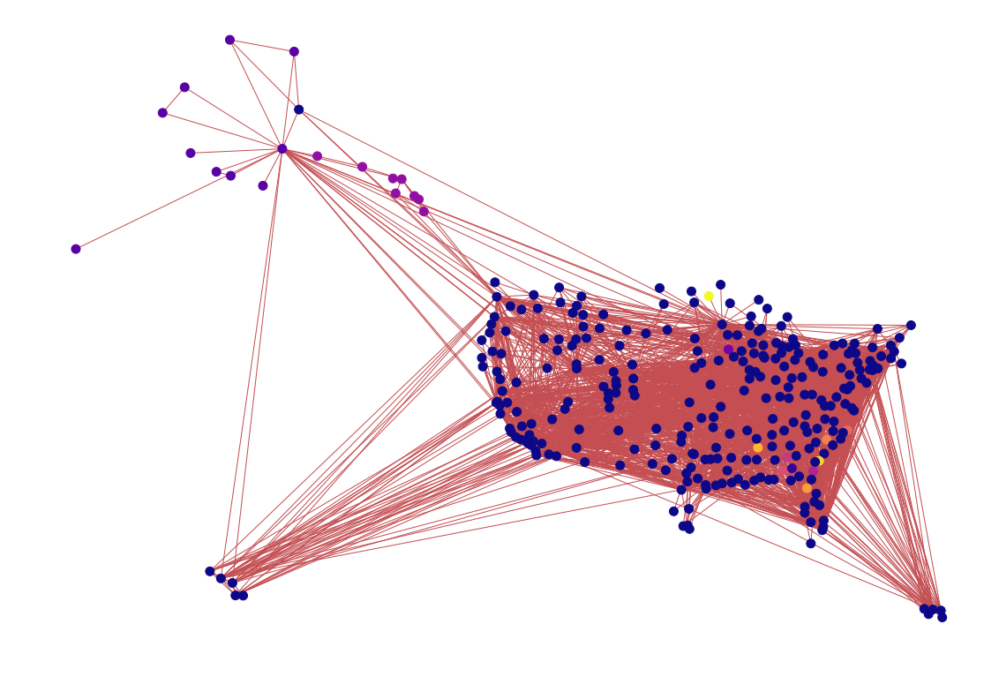

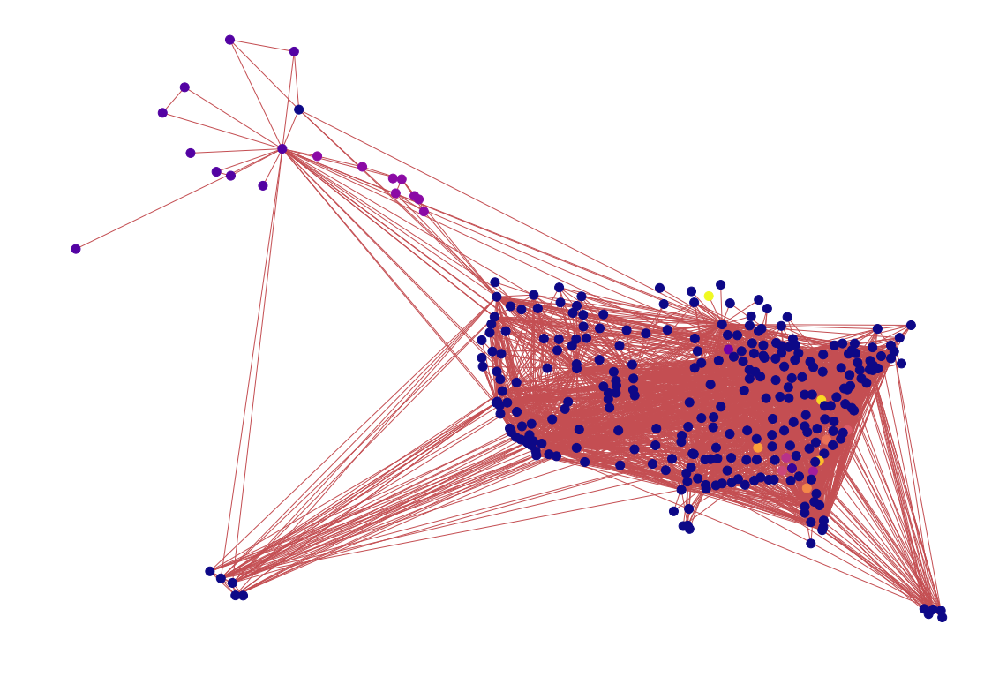

In [616]:
comp = nx.community.girvan_newman(G)
k = 15
limited = itertools.takewhile(lambda c: len(c) <= k, comp)
for communities in limited:
    c = dict()
    i = 0
    for community in communities:
        for node in community:
            c[node] = i
        i += 1
    
    node_color = []
    for node in G.nodes:
        node_color.append(c[node])

    plot_graph(G, 'real_coord', node_color=node_color)    

## Label propagation

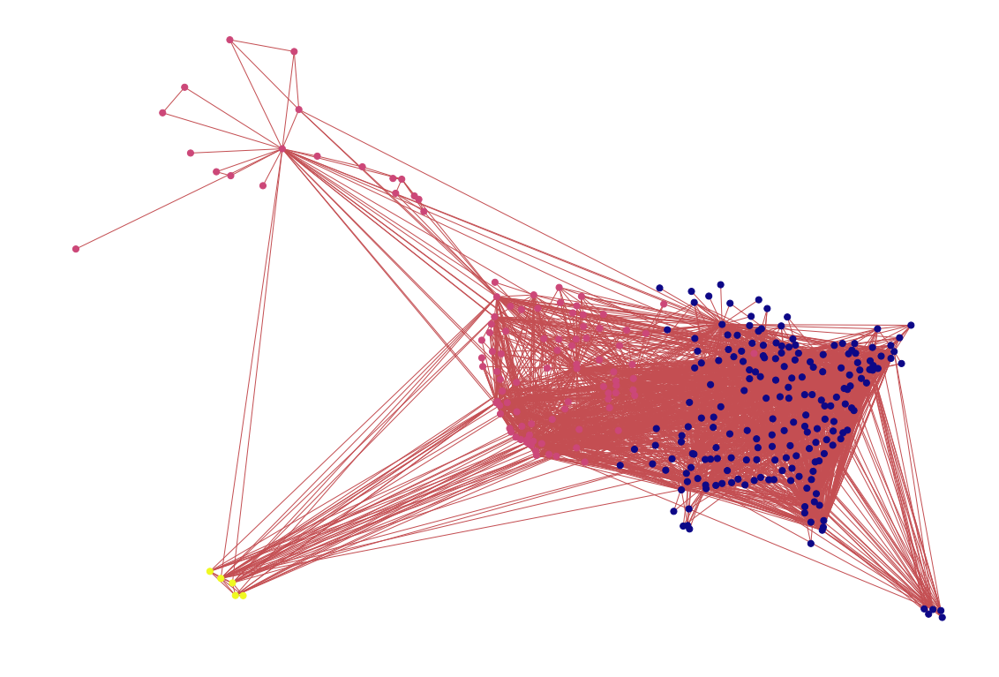

In [431]:
communities = nx.community.asyn_lpa_communities(G, weight='weight')
c = dict()
i = 0
for community in communities:
    for node in community:
        c[node] = i
    i += 1
    
node_color = []
for node in G.nodes:
    node_color.append(c[node])

plot_graph(G, 'real_coord', node_color=node_color)   

## Spectral clustering

In [617]:
eigvals, eigvec = scipy.linalg.eig(nx.laplacian_matrix(G, weight=None).toarray())

In [618]:
idx = np.argsort(eigvals)

In [619]:
eigvals[idx][:10]

array([-8.66135813e-16+0.j,  4.32089511e-01+0.j,  7.13207093e-01+0.j,
        9.02325831e-01+0.j,  9.17496145e-01+0.j,  9.41258771e-01+0.j,
        9.59467470e-01+0.j,  9.64909102e-01+0.j,  9.72201016e-01+0.j,
        9.73675843e-01+0.j])

In [620]:
comm = np.sign(eigvec[:, idx[1]])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  """


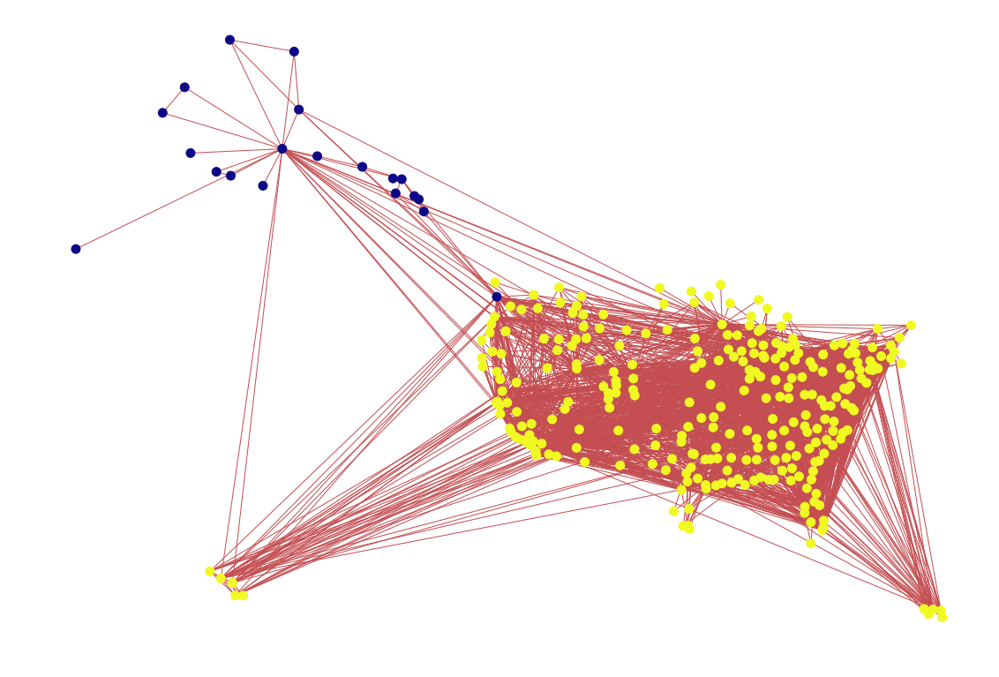

In [621]:
comm = np.sign(eigvec[:, idx[1]])
node_color = []
i = 0
for node in G.nodes:
    node_color.append(int(comm[i]))
    i += 1

plot_graph(G, 'real_coord', node_color=node_color)

## SVD

In [622]:
from sklearn.cluster import KMeans

In [623]:
u, s, v = np.linalg.svd(nx.adjacency_matrix(G, weight=None).toarray())

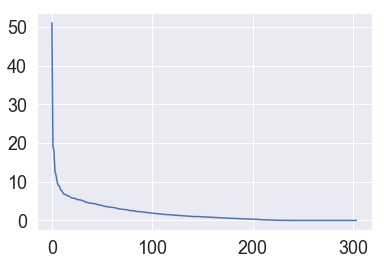

In [624]:
plt.plot(s)

n_clusters = 2


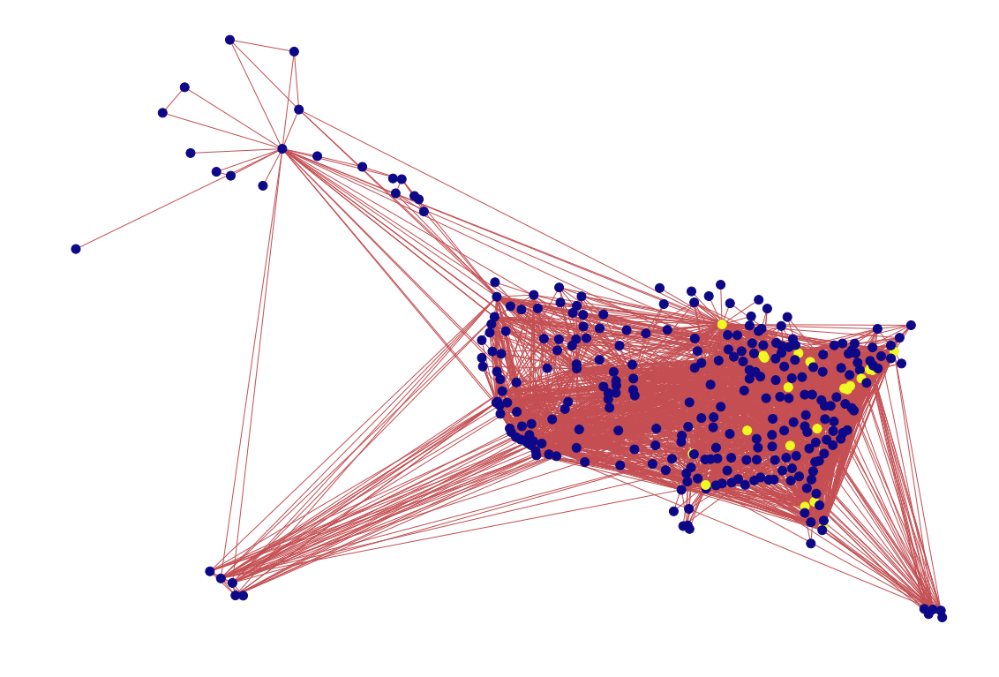

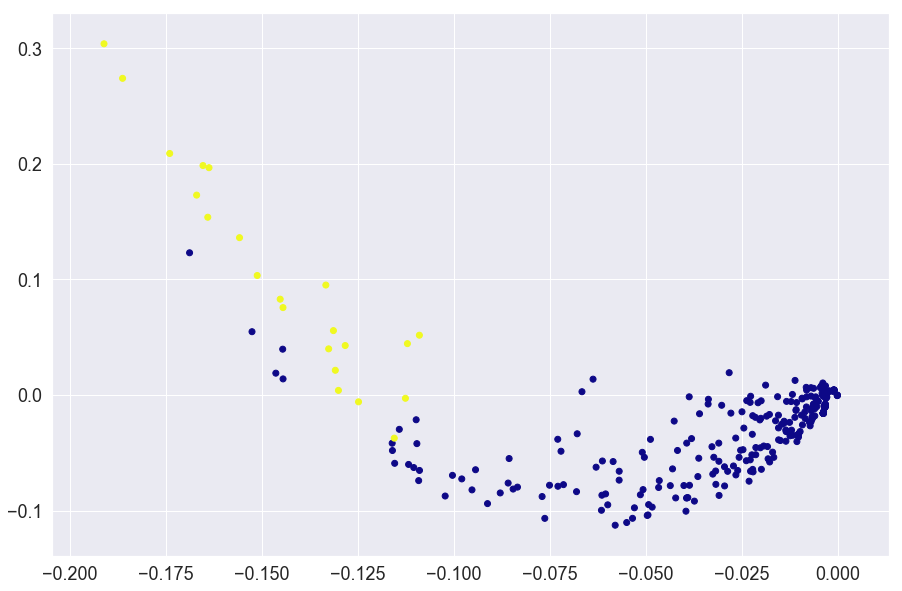

n_clusters = 3


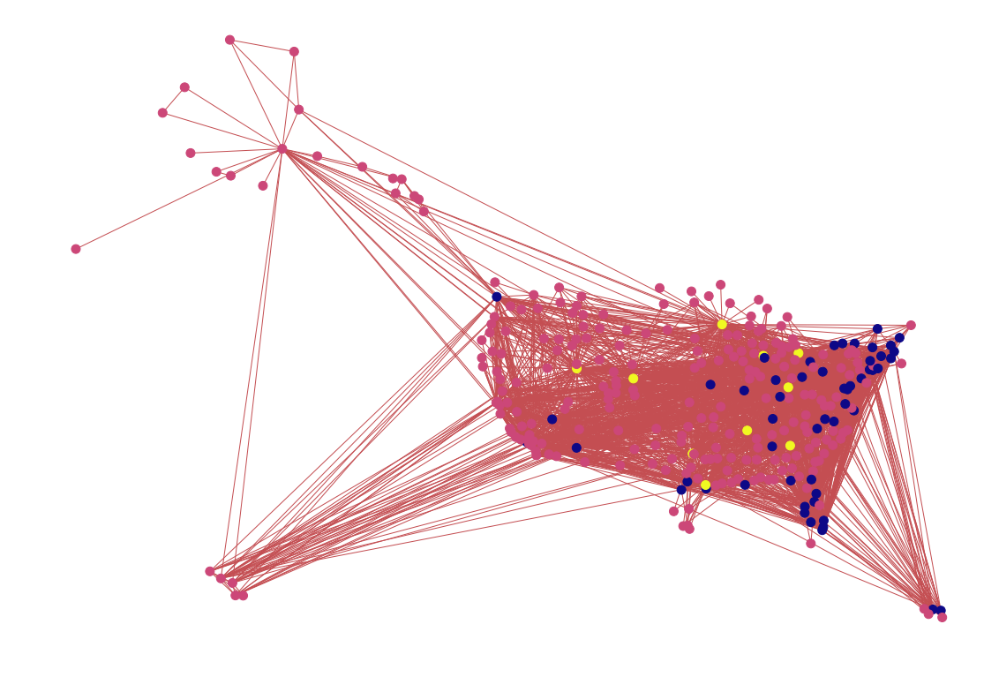

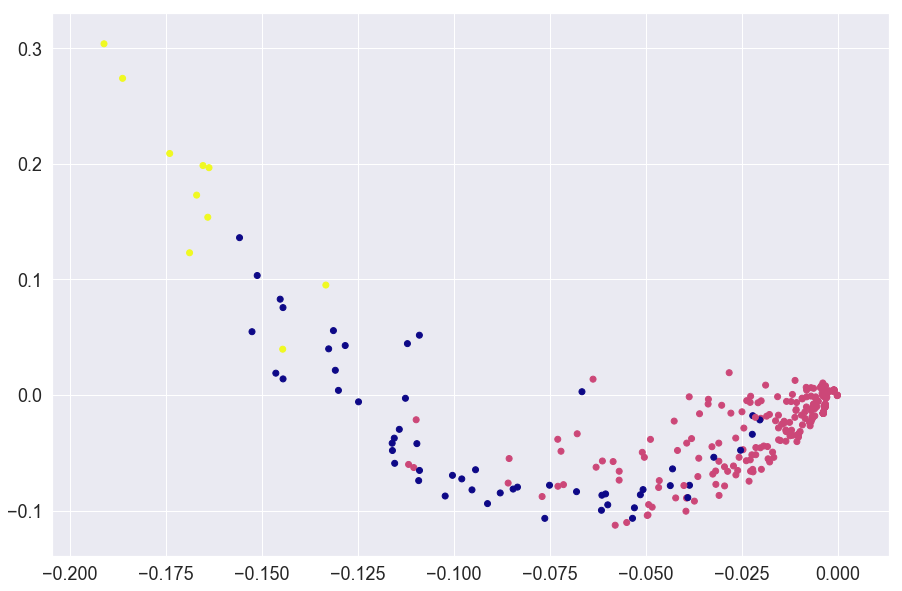

n_clusters = 5


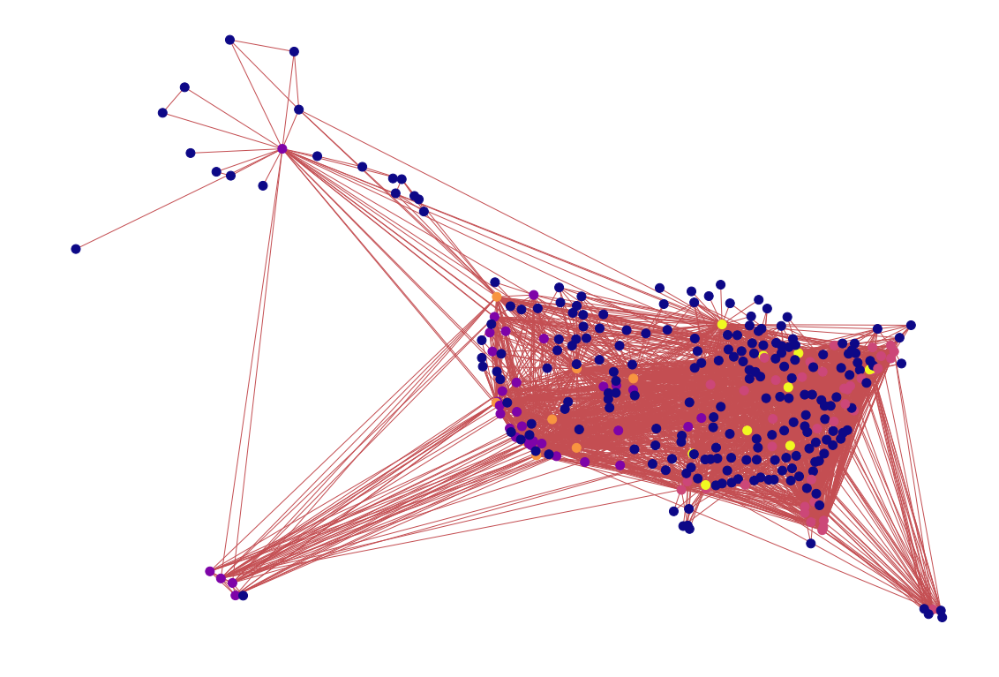

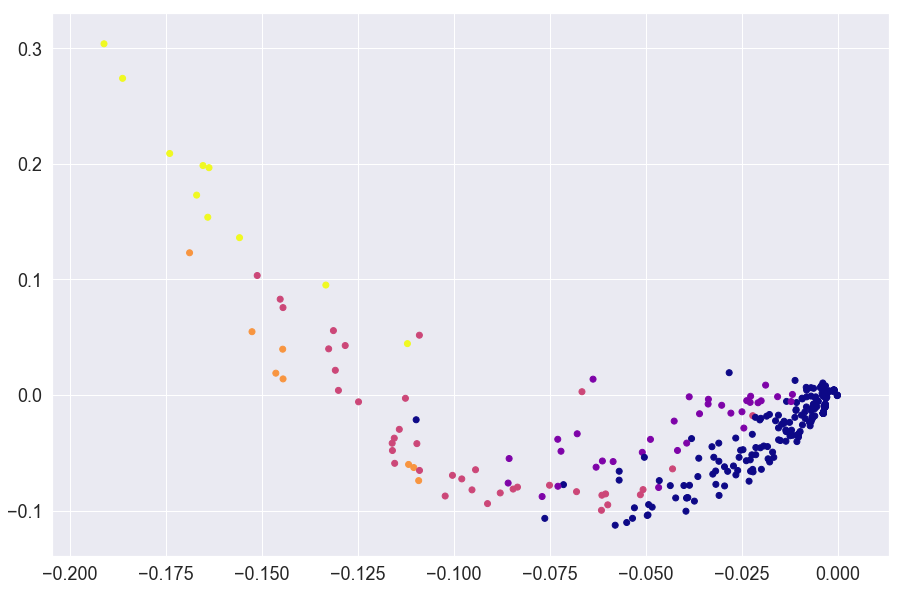

In [625]:
for n_clusters in [2, 3, 5]:
    clusters = KMeans(n_clusters=n_clusters).fit_predict(u[:, :5])
    node_color = []
    i = 0
    for node in G.nodes:
        node_color.append(clusters[i])
        i += 1

    print('n_clusters = {}'.format(n_clusters))
    plot_graph(G, 'real_coord', node_color=node_color)
    plt.figure(figsize=(15, 10))
    plt.scatter(u[:, 0], u[:, 1], c=clusters/np.max(clusters), cmap=plt.get_cmap('plasma'))
    plt.show()